#Cells Image Segmentation Using K-Means

###Libraries

In [10]:
import numpy as np
import cv2
import urllib.request
import matplotlib.pyplot as plt

###Importing Images

In [11]:
def from_url(url):
    # Download image file from URL
    response = urllib.request.urlopen(url)
    image = np.asarray(bytearray(response.read()), dtype=np.uint8)
    image = cv2.imdecode(image, -1)

    # Return the imported image
    return image

url1 = "https://raw.githubusercontent.com/cakkamidi/cell-image-cigar/main/001_w_1500.jpg"
url2 = "https://raw.githubusercontent.com/cakkamidi/cell-image-cigar/main/002_w_1500.jpg"
url3 = "https://raw.githubusercontent.com/cakkamidi/cell-image-cigar/main/003_w_1500.jpg"
url4 = "https://raw.githubusercontent.com/cakkamidi/cell-image-cigar/main/004_w_1500.jpg"
url5 = "https://raw.githubusercontent.com/cakkamidi/cell-image-cigar/main/007_w_1500.jpg"

image1 = from_url(url1)
image2 = from_url(url2)
image3 = from_url(url3)
image4 = from_url(url4)
image5 = from_url(url5)

images = [image1, image2, image3, image4, image5]

###Convert Image to HSV and Vectorize

In [12]:
def hsv(image):
    img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

    return img

def vectorize(img):
    vectorized = img.reshape((-1,3))
    vectorized = np.float32(vectorized)

    return vectorized

###Clustering Function Using K-Means Library from OpenCV

In [20]:
def cluster_image(image, criteria, K, attempts):
    img = hsv(image)
    vectorized = vectorize(img)
    ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((img.shape))
    wcss.append(ret)

    return result_image

###Clustering Function Using K-Means from Scratch

In [41]:
def cluster_manual(image, K, max_iterations=10):
    img = hsv(image)
    pixels = vectorize(img)
    
    # Randomly initialize centroids
    centroids = pixels[np.random.choice(range(pixels.shape[0]), K, replace=False)]
    
    for _ in range(max_iterations):
        # Assign each pixel to the nearest centroid
        distances = np.linalg.norm(pixels[:, np.newaxis] - centroids, axis=-1)
        labels = np.argmin(distances, axis=-1)
        
        # Update centroids
        new_centroids = np.empty_like(centroids)
        for k in range(K):
            if np.sum(labels == k) > 0:
                new_centroids[k] = pixels[labels == k].mean(axis=0)
            else:
                new_centroids[k] = centroids[k]
        
        # Check if centroids have converged
        if np.all(centroids == new_centroids):
            break
        
        centroids = new_centroids
    
    # Assign each pixel to the final centroid
    final_distances = np.linalg.norm(pixels[:, np.newaxis] - centroids, axis=-1)
    final_labels = np.argmin(final_distances, axis=-1)
    
    # Replace pixels with centroid values
    result_image = centroids[final_labels].reshape(image.shape)
    
    return result_image.astype(np.uint8)

###Visualize Results

In [14]:
def visualize(img, result_image):
    figure_size = 15
    plt.figure(figsize=(figure_size,figure_size))
    plt.subplot(1,2,1),plt.imshow(img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(1,2,2),plt.imshow(result_image)
    plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
    plt.show()

###Define Clustering Parameters

In [23]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
attempts = 10
max_K = 10

###Obtain Optimum Value of K with Elbow Method

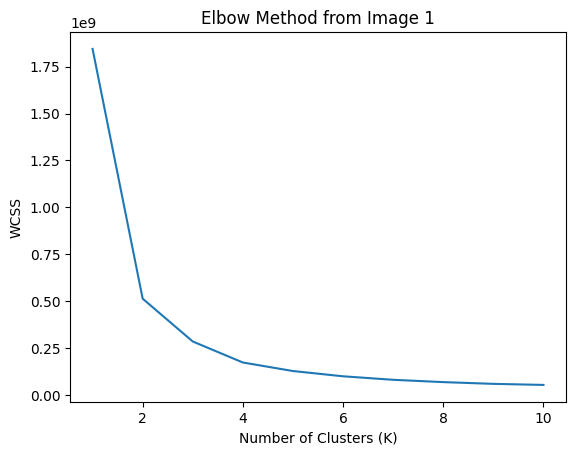

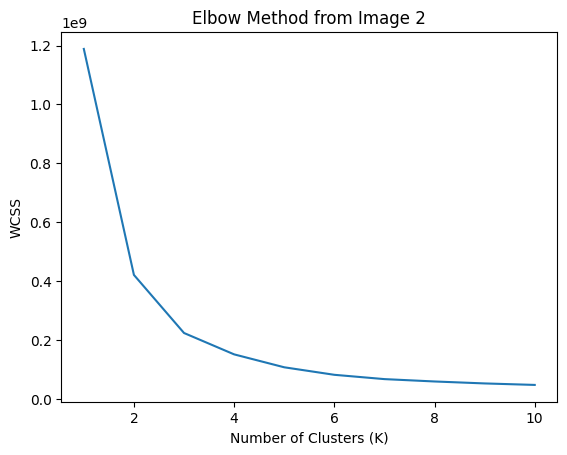

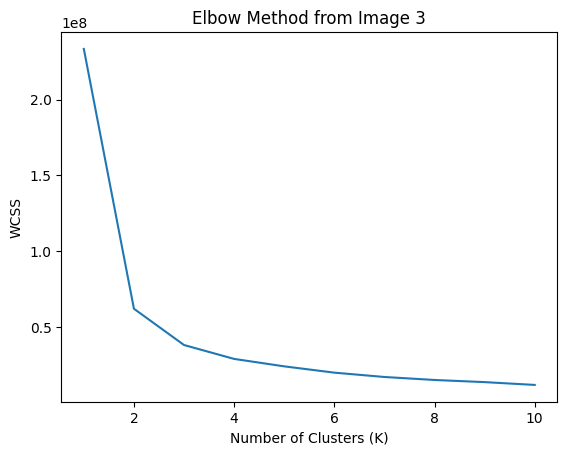

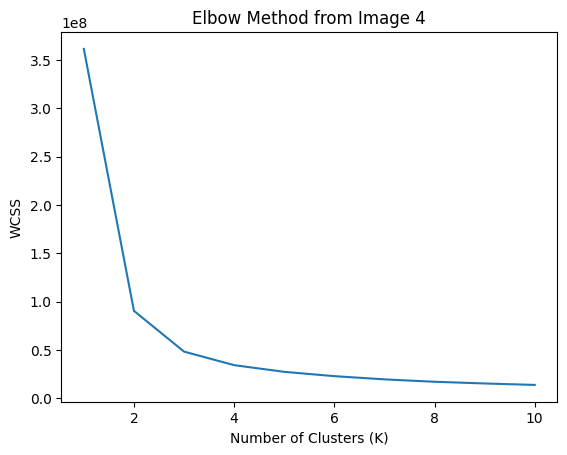

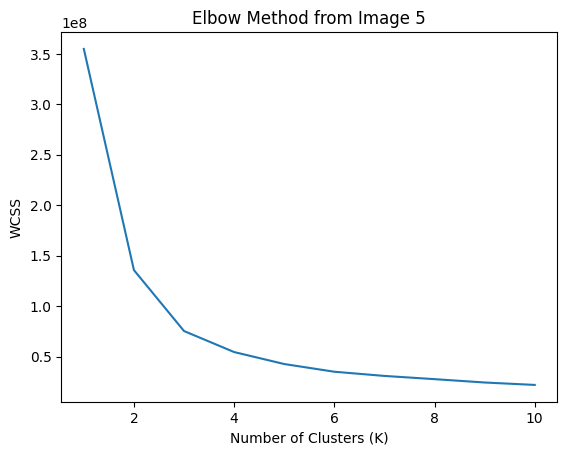

In [29]:
index = 0
for image in images:
    wcss = []
    index +=1
    for K in range(1,max_K+1):
        cluster_image(image, criteria, K, attempts)
    
    plt.plot(range(1, max_K+1), wcss)
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('WCSS')
    plt.title('Elbow Method from Image %i' % index)
    plt.show()

###Results of Clustering Using Library

#####K = 2

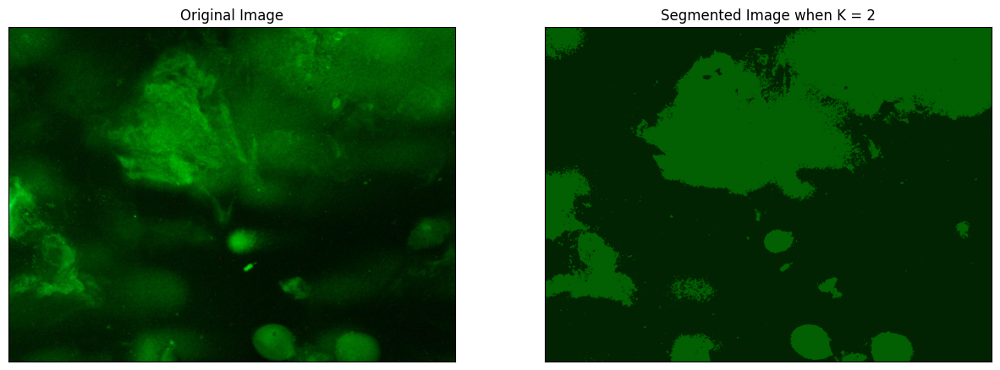

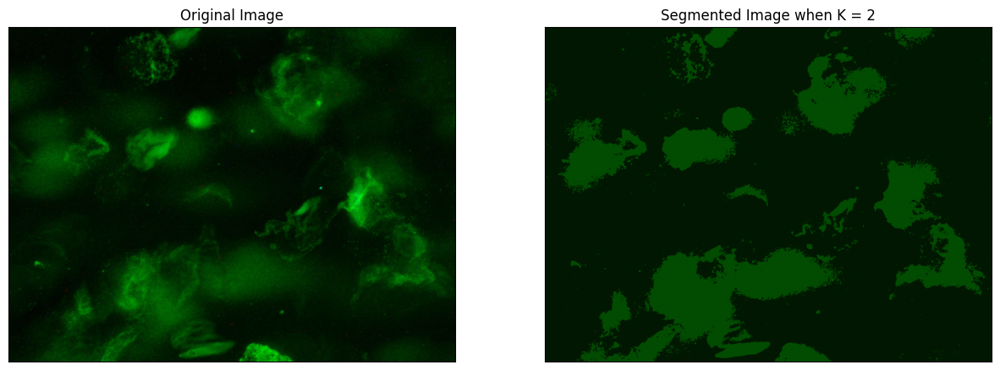

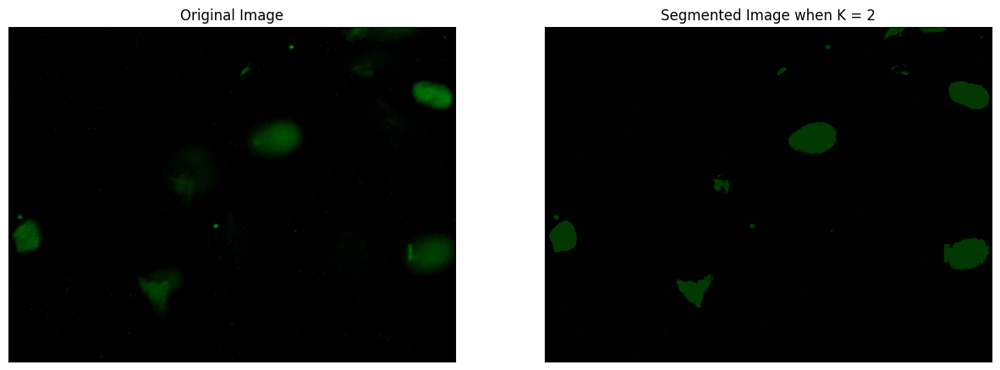

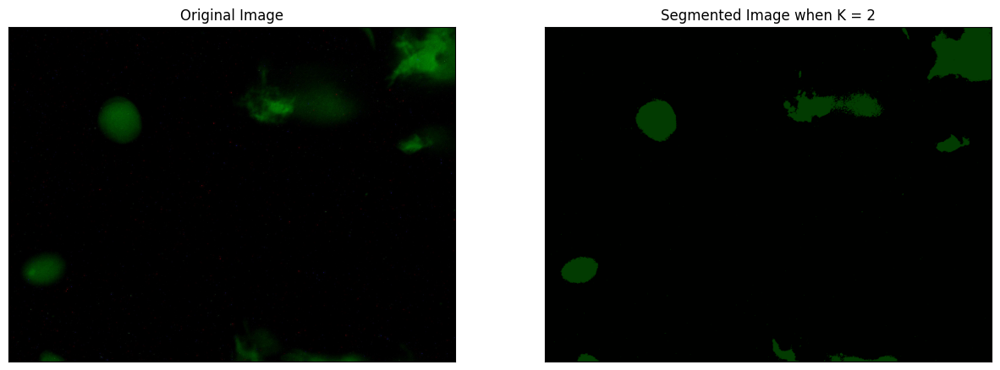

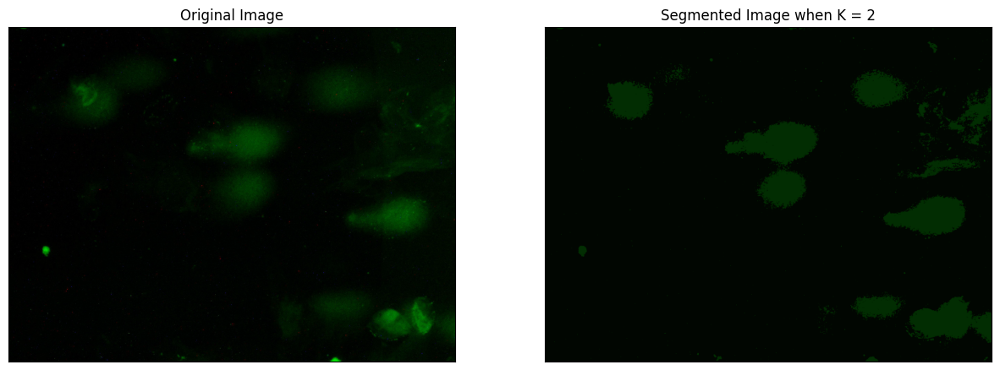

In [30]:
K = 2
res = []
for image in images:
    res.append(cluster_image(image, criteria, K, attempts))

for i in range(len(images)):
    visualize(images[i], res[i])

#####K = 3

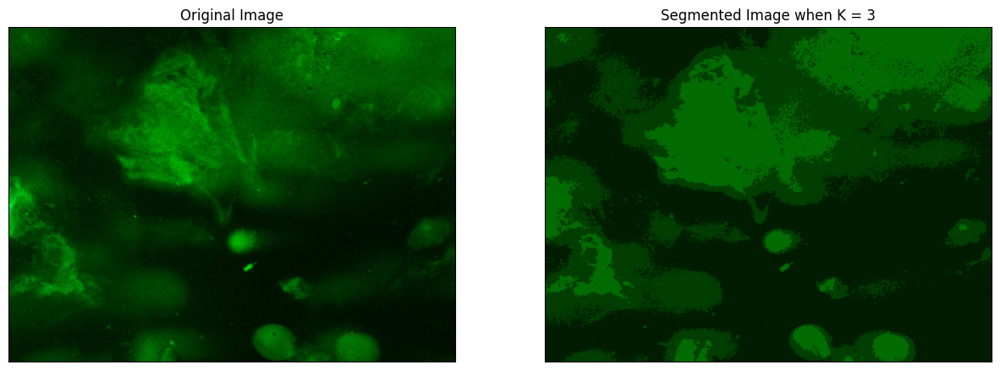

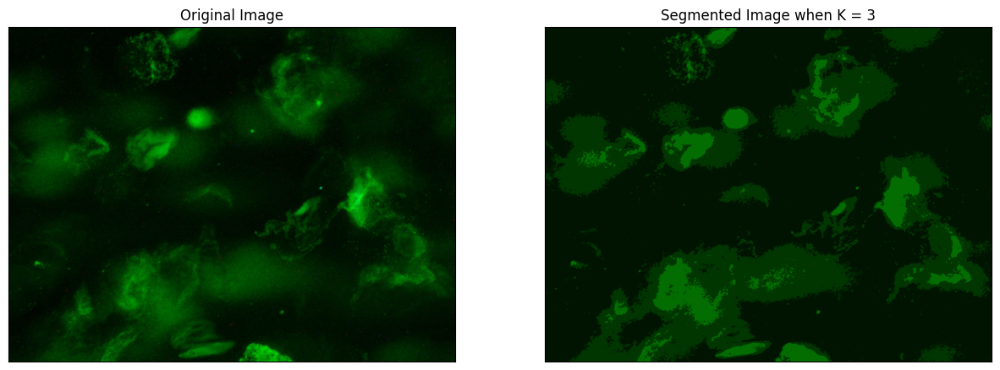

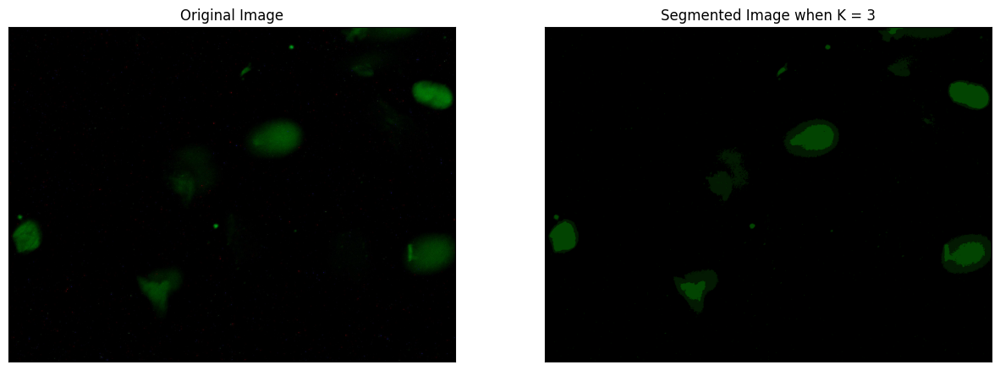

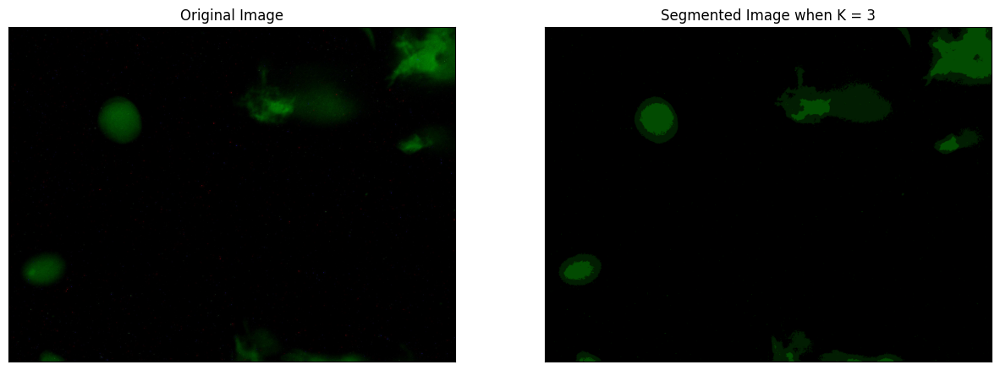

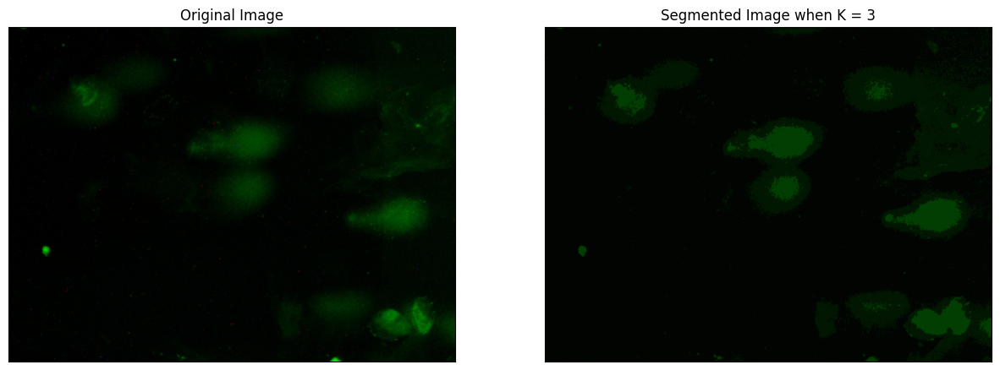

In [31]:
K = 3
res = []
for image in images:
    res.append(cluster_image(image, criteria, K, attempts))

for i in range(len(images)):
    visualize(images[i], res[i])

#####K = 4

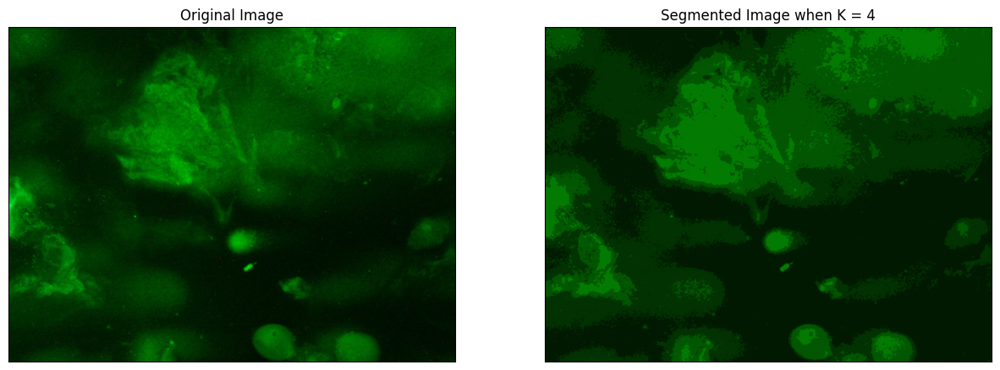

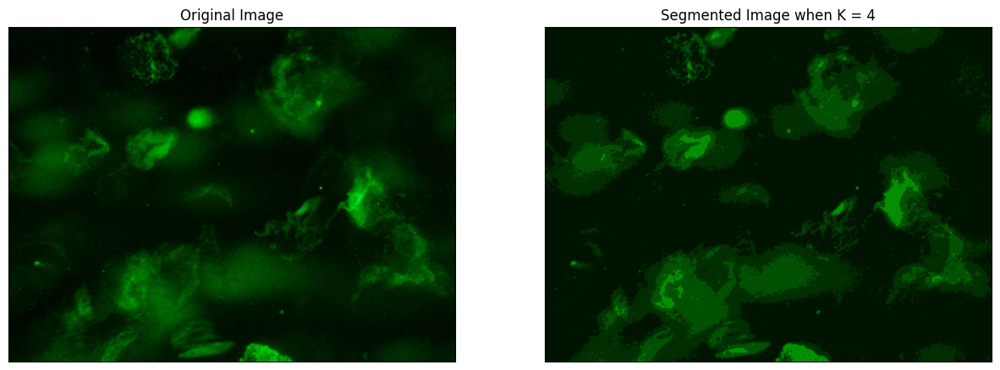

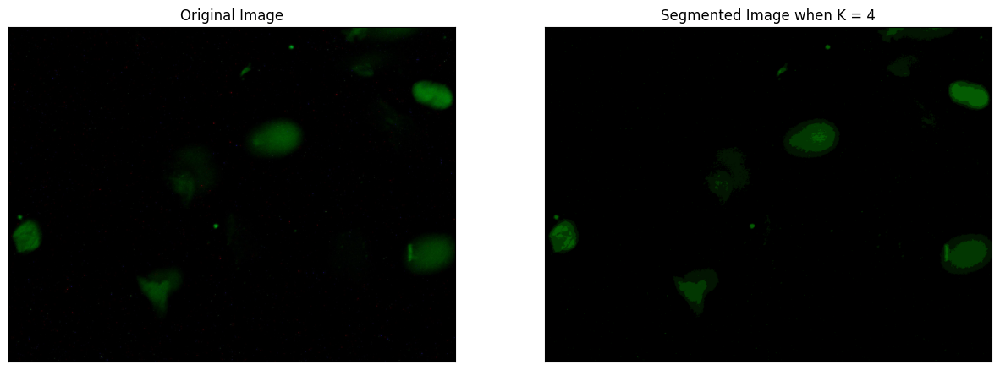

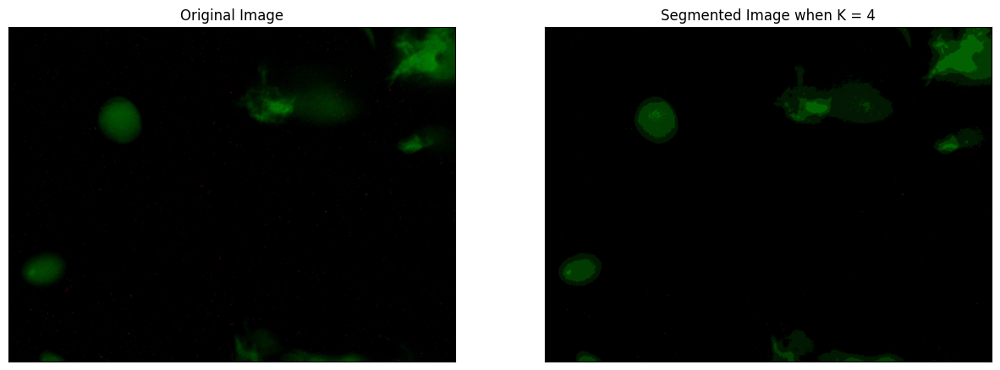

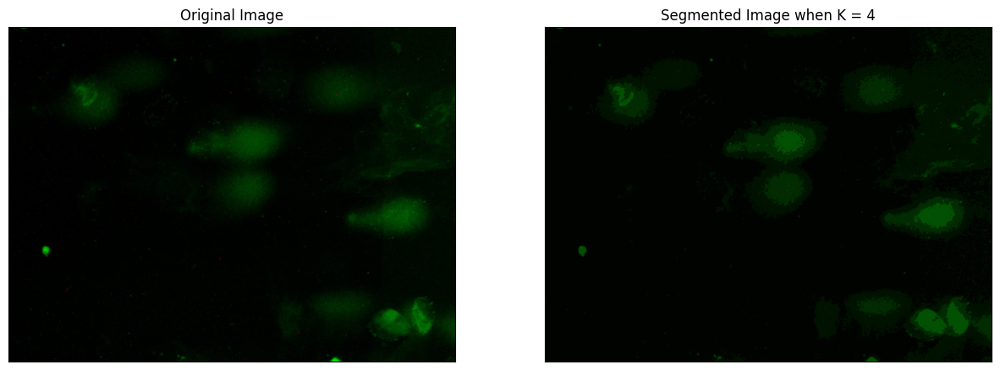

In [32]:
K = 4
res = []
for image in images:
    res.append(cluster_image(image, criteria, K, attempts))

for i in range(len(images)):
    visualize(images[i], res[i])

###Results of Clustering from Scratch

#####K = 2

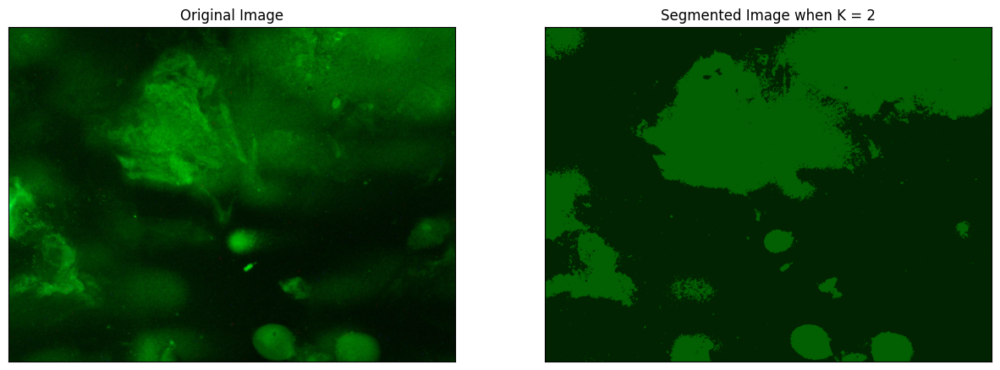

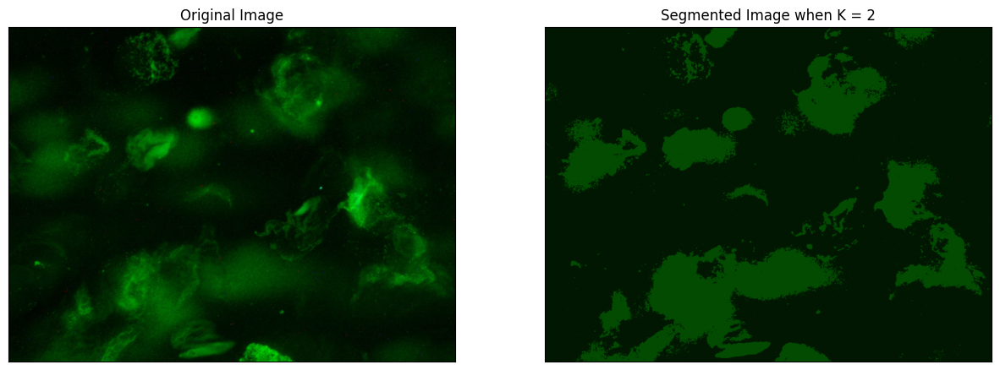

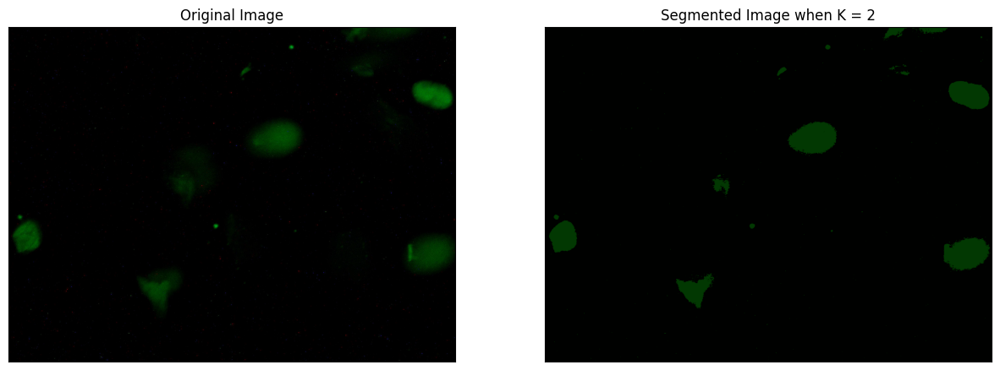

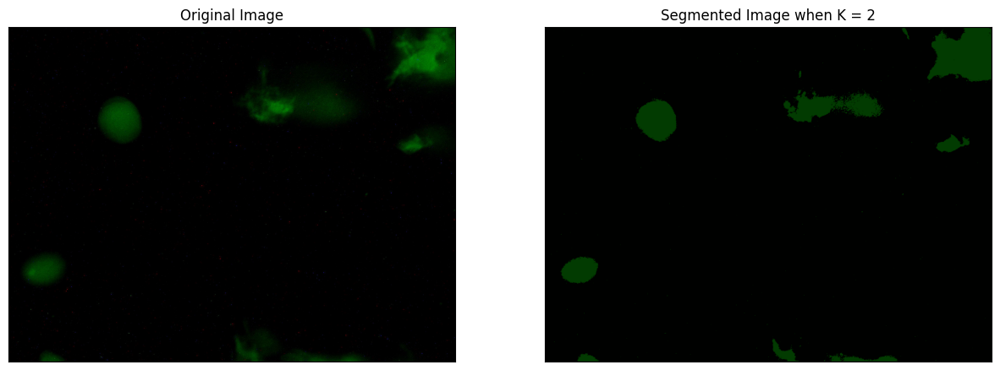

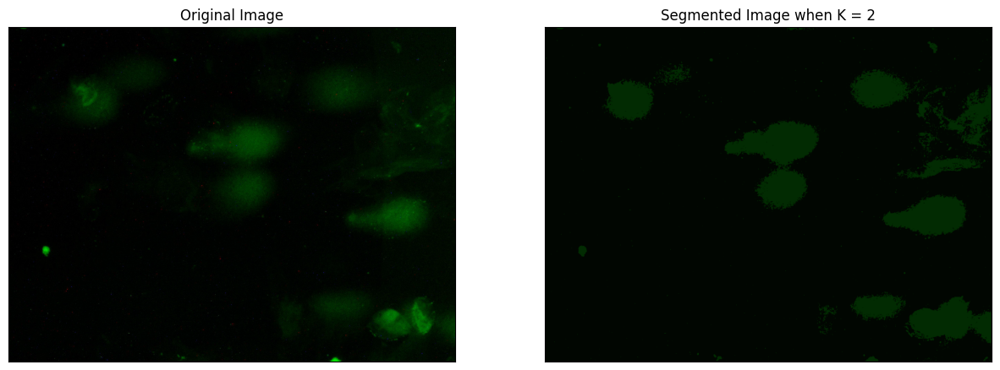

In [42]:
K = 2
res = []
for image in images:
    res.append(cluster_manual(image, K))

for i in range(len(images)):
    visualize(images[i], res[i])

#####K = 3

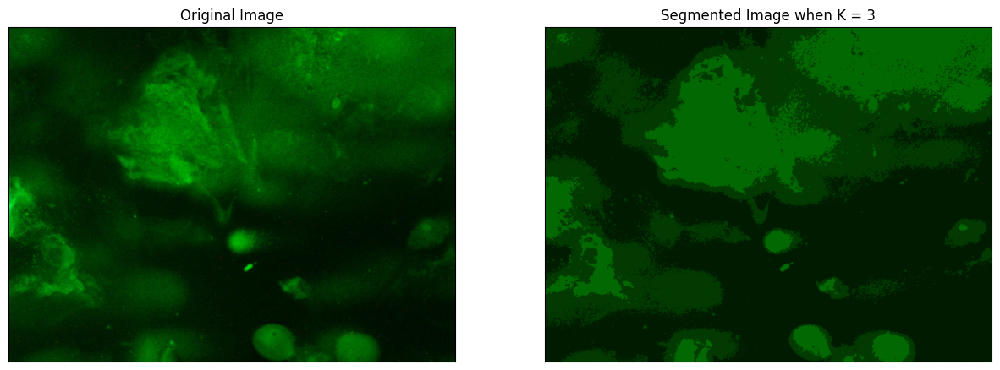

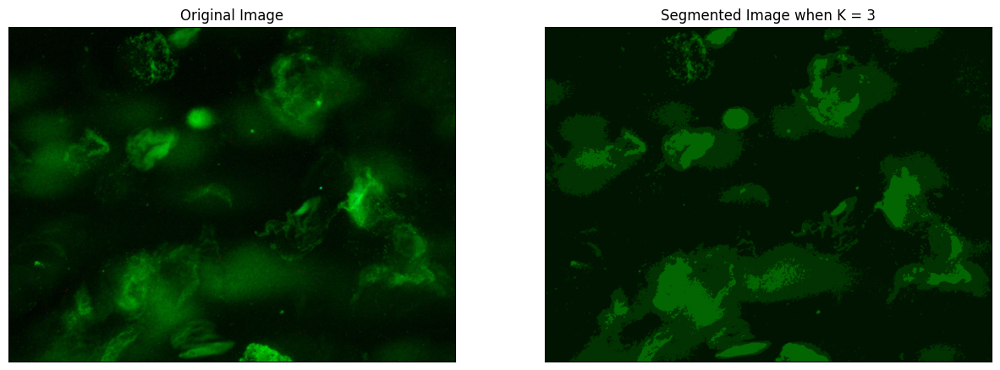

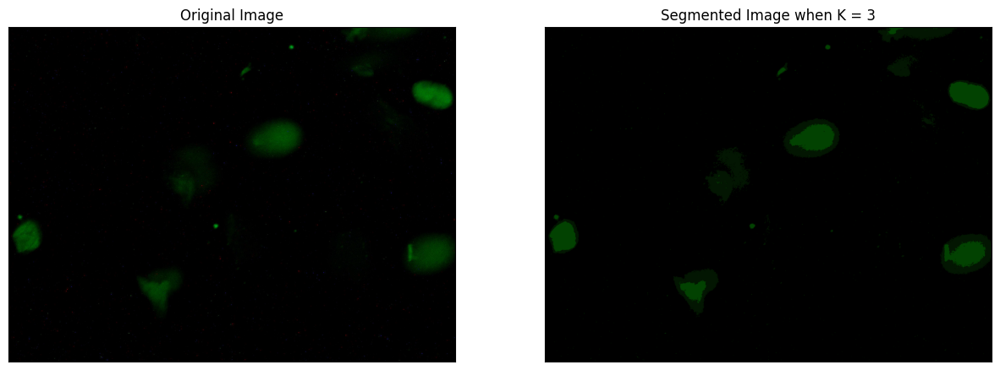

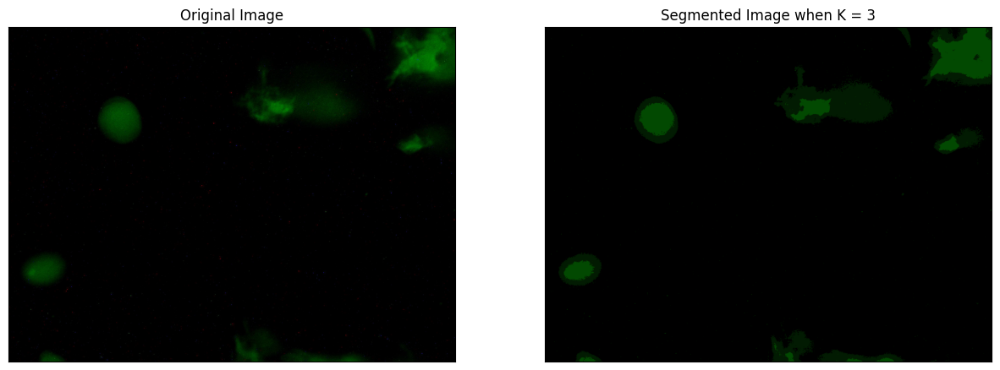

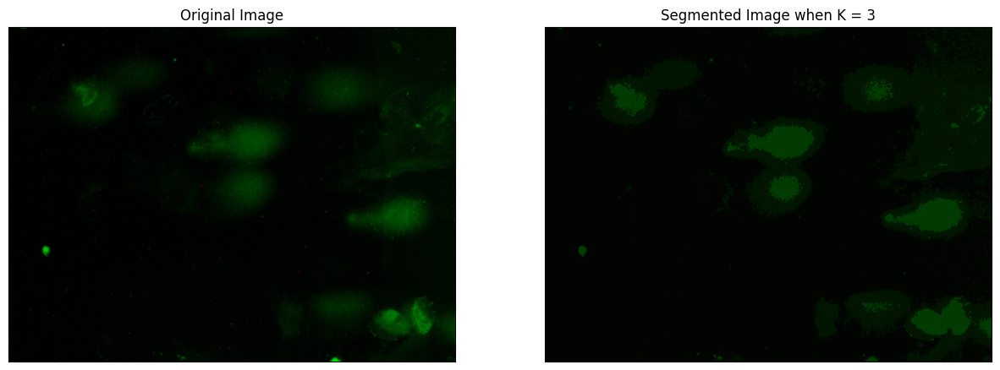

In [43]:
K = 3
res = []
for image in images:
    res.append(cluster_manual(image, K))

for i in range(len(images)):
    visualize(images[i], res[i])

#####K = 4

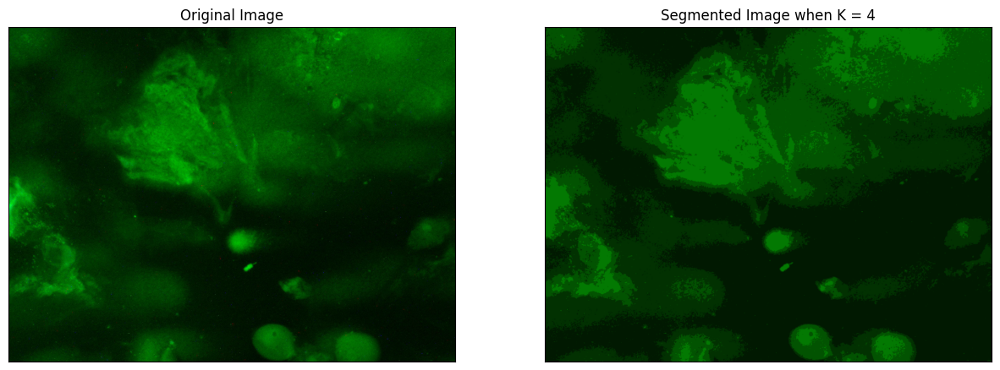

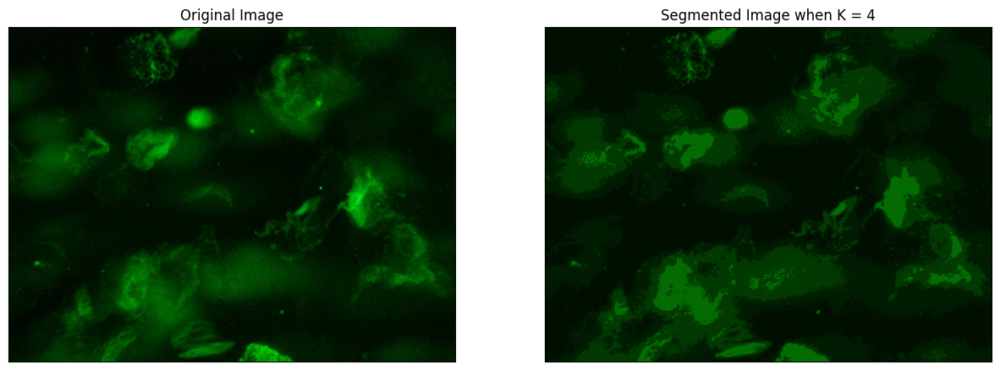

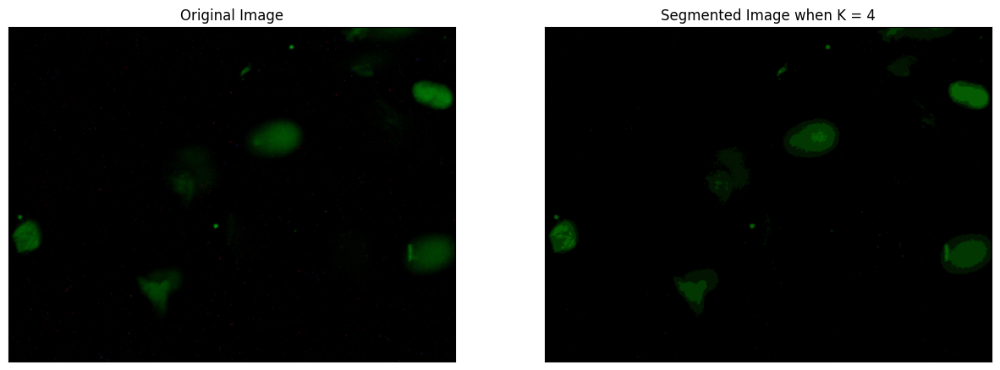

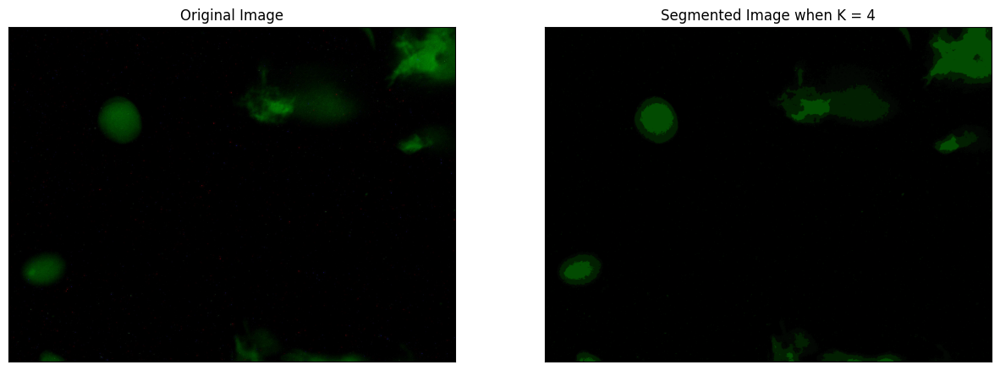

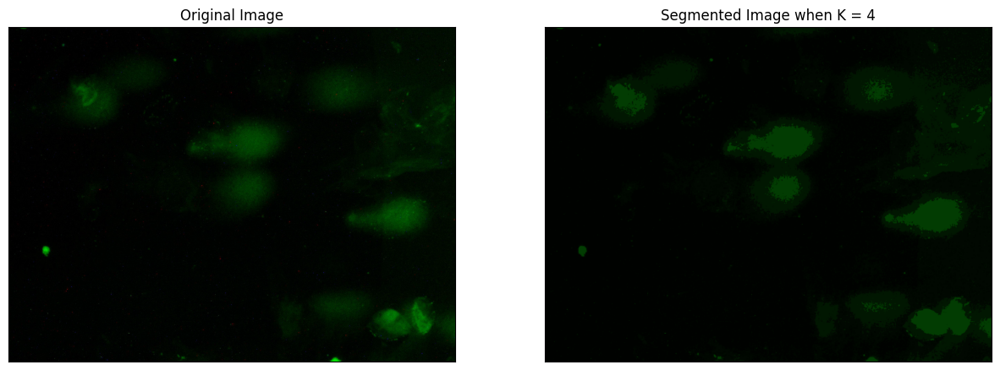

In [44]:
K = 4
res = []
for image in images:
    res.append(cluster_manual(image, K))

for i in range(len(images)):
    visualize(images[i], res[i])